In [3]:
import os
import numpy as np
import cv2
from pathlib import Path

def load_inria_images(dataset_path: str, split: str = "Train", max_images: int = 50):
    """
    Load INRIA dataset images.
    
    Expected folder structure:
    INRIA/
    ├── Train/
    │   ├── pos/           ← positive images (with pedestrians)
    │   └── neg/           ← negative images
    └── Test/
        ├── pos/
        └── neg/
    """
    pos_path = Path(dataset_path) / split / "JPEGImages"
    images = []
    image_paths = []

    for img_file in sorted(pos_path.glob("*.png"))[:max_images]:
        img = cv2.imread(str(img_file))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (416, 416))   # Resize to model input size
        images.append(img)
        image_paths.append(str(img_file))

    # Normalize to [0, 1]
    images_array = np.array(images, dtype=np.float32) / 255.0
    print(f"Loaded {len(images_array)} images from {pos_path}")
    return images_array, image_paths


# Load images
INRIA_PATH = "./INRIA"   # Change to your path
x_train, paths = load_inria_images(INRIA_PATH, split="Train", max_images=50)
print(f"Image array shape: {x_train.shape}")  # (N, 416, 416, 3)

Loaded 50 images from INRIA\Train\JPEGImages
Image array shape: (50, 416, 416, 3)


In [8]:
import torch
import torchvision
from art.estimators.object_detection import PyTorchFasterRCNN

from art.estimators.object_detection.pytorch_yolo import PyTorchYolo

def get_detector():
    """Load a pretrained Faster R-CNN model."""
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(
        weights=torchvision.models.detection.FasterRCNN_ResNet50_FPN_Weights.DEFAULT,
        min_size=400, 
        max_size=600
    )
    
    model.to(device)
    model.eval()
    return model, device

model, device = get_detector()
# Wrap with ART estimator
detector = PyTorchFasterRCNN(
    model=model,
    clip_values=(0.0, 1.0),
    channels_first=False,           # Images are (N, H, W, C)
    device_type="gpu",
    attack_losses=(
        "loss_classifier",
        "loss_box_reg",
        "loss_objectness",
        "loss_rpn_box_reg",
    ),
)

print("Detector ready.")

Detector ready.


In [5]:
from art.estimators.object_detection.pytorch_detection_transformer import PyTorchDetectionTransformer

MEAN = [0.485, 0.456, 0.406]
STD = [0.229, 0.224, 0.225]
NUMBER_CHANNELS = 3
INPUT_SHAPE = (NUMBER_CHANNELS, 416, 416)

# detector = PyTorchDetectionTransformer(channels_first=True, preprocessing=(MEAN, STD), input_shape=INPUT_SHAPE, clip_values=(0,1))

In [6]:
def visualize_predictions(detector, images, threshold=0.5, num_show=2):
    """Check model detects pedestrians before patching."""
    predictions = detector.predict(x=images[:num_show], standardise_output=True)

    for i, pred in enumerate(predictions):
        boxes  = pred["boxes"]
        labels = pred["labels"]
        scores = pred["scores"]

        keep = scores >= threshold
        print(f"\nImage {i}: {keep.sum()} detections above threshold {threshold}")
        for box, label, score in zip(boxes[keep], labels[keep], scores[keep]):
            # COCO class 1 = person
            print(f"  Label={label}, Score={score:.3f}, Box={box.astype(int)}")

visualize_predictions(detector, x_train)


Image 0: 10 detections above threshold 0.5
  Label=1, Score=0.998, Box=[141  49 259 303]
  Label=1, Score=0.992, Box=[ 85  75 149 278]
  Label=1, Score=0.990, Box=[261 135 416 400]
  Label=1, Score=0.975, Box=[ 17 137 104 301]
  Label=1, Score=0.962, Box=[  4  61  96 243]
  Label=1, Score=0.881, Box=[  0  69  31 155]
  Label=1, Score=0.684, Box=[ 73  61  98 105]
  Label=32, Score=0.565, Box=[ 99 118 110 164]
  Label=1, Score=0.551, Box=[  0  70  28 255]
  Label=3, Score=0.506, Box=[128  82 167 113]

Image 1: 9 detections above threshold 0.5
  Label=1, Score=0.996, Box=[330  23 386 251]
  Label=1, Score=0.996, Box=[ 29  40 103 256]
  Label=1, Score=0.984, Box=[  0  62  37 236]
  Label=1, Score=0.984, Box=[ 93  69 309 386]
  Label=1, Score=0.966, Box=[280  40 340 247]
  Label=1, Score=0.832, Box=[211  34 250 115]
  Label=31, Score=0.815, Box=[268 127 283 170]
  Label=27, Score=0.648, Box=[295  67 335 160]
  Label=64, Score=0.510, Box=[376  72 414 241]


In [ ]:
from art.attacks.evasion import DPatch

# --- Configuration ---
PATCH_HEIGHT  = 75      # pixels
PATCH_WIDTH   = 75
PATCH_CHANNELS = 3
LEARNING_RATE  = 10.0
MAX_ITER       = 20
BATCH_SIZE     = 1

dpatch = DPatch(
    estimator=detector,
    patch_shape=(PATCH_HEIGHT, PATCH_WIDTH, PATCH_CHANNELS),
    learning_rate=LEARNING_RATE,
    max_iter=MAX_ITER,
    batch_size=BATCH_SIZE,
    verbose=True,
)

torch.cuda.empty_cache()
import gc
gc.collect()

# ---- Untargeted attack (suppresses all detections) ----
adversarial_patch = dpatch.generate(
    x=x_train,
    y=None,             # None → untargeted, model's own predictions used as target
)

print(f"Patch generated. Shape: {adversarial_patch.shape}")
np.save("dpatch_inria.npy", adversarial_patch)


0: 416x416 8 persons, 1 tie, 5.5ms
1: 416x416 9 persons, 1 suitcase, 1 potted plant, 5.5ms
2: 416x416 7 persons, 1 potted plant, 5.5ms
3: 416x416 7 persons, 1 potted plant, 5.5ms
4: 416x416 13 persons, 1 tie, 5.5ms
5: 416x416 11 persons, 2 ties, 1 suitcase, 5.5ms
6: 416x416 6 persons, 1 skis, 5.5ms
7: 416x416 7 persons, 5.5ms
8: 416x416 1 person, 1 bench, 5.5ms
9: 416x416 1 person, 2 benchs, 5.5ms
10: 416x416 5 persons, 5.5ms
11: 416x416 1 person, 5.5ms
12: 416x416 1 person, 5.5ms
13: 416x416 1 person, 1 backpack, 5.5ms
14: 416x416 1 person, 5.5ms
15: 416x416 2 persons, 5.5ms
16: 416x416 1 person, 1 backpack, 5.5ms
17: 416x416 1 person, 5.5ms
18: 416x416 1 person, 5.5ms
19: 416x416 1 person, 5.5ms
20: 416x416 1 person, 5.5ms
21: 416x416 2 persons, 5.5ms
22: 416x416 3 persons, 1 backpack, 2 handbags, 5.5ms
23: 416x416 1 person, 1 backpack, 5.5ms
24: 416x416 1 person, 5.5ms
25: 416x416 2 persons, 5.5ms
26: 416x416 4 persons, 5.5ms
27: 416x416 2 persons, 5.5ms
28: 416x416 1 person, 1 bir

DPatch iteration:   0%|          | 0/20 [00:00<?, ?it/s]


TypeError: unhashable type: 'slice'

In [7]:
# Apply patch to test images
x_test, _ = load_inria_images(INRIA_PATH, split="Test", max_images=20)

patched_images = dpatch.apply_patch(
    x=x_test,
    random_location=False,
       # Random placement per image
)

print("\n--- Predictions BEFORE patch ---")
visualize_predictions(detector, x_test, threshold=0.5)

print("\n--- Predictions AFTER patch ---")
visualize_predictions(detector, patched_images, threshold=0.5)

Loaded 20 images from INRIA\Test\JPEGImages


NameError: name 'dpatch' is not defined

In [9]:
preds_clean = detector.predict(x_test)

naturalistic_patch = np.load("naturalistic_patched.npy")
preds_patched = detector.predict(naturalistic_patch)


avg_conf_clean = np.mean([p['scores'].max() if len(p['scores']) > 0 else 0 for p in preds_clean])
avg_conf_patched = np.mean([p['scores'].max() if len(p['scores']) > 0 else 0 for p in preds_patched])

print(f"Clean Avg Confidence: {avg_conf_clean:.4f}")
print(f"Patched Avg Confidence: {avg_conf_patched:.4f}")
print(f"Total Confidence Drop: {avg_conf_clean - avg_conf_patched:.4f}")

Clean Avg Confidence: 0.9977
Patched Avg Confidence: 0.0000
Total Confidence Drop: 0.9977


In [ ]:
import logging

# Configure the logger
logging.basicConfig(
    filename='attack_results.log', 
    level=logging.INFO,
    format='%(asctime)s - %(levelname)s - %(message)s',
    datefmt='%Y-%m-%d %H:%M:%S'
)

logging.info(f"Experiment: DPatch Upper Left Corner")
logging.info(f"Model: Faster RCNN")
logging.info(f"Method: Dpatch")
logging.info(f"PATCH_HEIGHT  = {PATCH_HEIGHT}, PATCH_WIDTH   = {PATCH_WIDTH}, LEARNING_RATE  = {LEARNING_RATE} MAX_ITER = {MAX_ITER}")
logging.info(f"Clean Avg Confidence: {avg_conf_clean:.4f}")
logging.info(f"Patched Avg Confidence: {avg_conf_patched:.4f}")
logging.info(f"total Confidence Drop: {avg_conf_clean - avg_conf_patched:.4f}")
logging.info("-" * 30)

In [10]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np

def visualize_predictions(detector, images, threshold=0.5):
    """
    Displays images with bounding boxes for predictions above a certain threshold.
    """
    # 1. Get predictions from the ART detector
    # ART returns a list of dictionaries containing 'boxes' and 'scores'
    preds = detector.predict(images)

    for i, img in enumerate(images):
        plt.figure(figsize=(10, 6))
        ax = plt.gca()
        
        # Display the image
        # If images are (C, H, W), transpose to (H, W, C) for imshow
        if img.shape[0] == 3:
            img_to_show = np.transpose(img, (1, 2, 0))
        else:
            img_to_show = img
            
        plt.imshow(img_to_show)
        
        # 2. Extract boxes and scores
        boxes = preds[i]['boxes']
        scores = preds[i]['scores']
        labels = preds[i]['labels']

        # 3. Filter and Draw
        found_detections = False
        for box, score, label in zip(boxes, scores, labels):
            if score >= threshold:
                found_detections = True
                x1, y1, x2, y2 = box
                
                # Create a rectangle patch
                rect = patches.Rectangle(
                    (x1, y1), x2 - x1, y2 - y1, 
                    linewidth=2, edgecolor='r', facecolor='none'
                )
                ax.add_patch(rect)
                
                # Add label and score text
                plt.text(x1, y1, f"Label: {label} ({score:.2f})", 
                         color='white', backgroundcolor='red', fontsize=8)

        title_status = "Predictions" if found_detections else "No Detections Found"
        plt.title(f"Image {i}: {title_status}")
        plt.axis('off')
        plt.show()

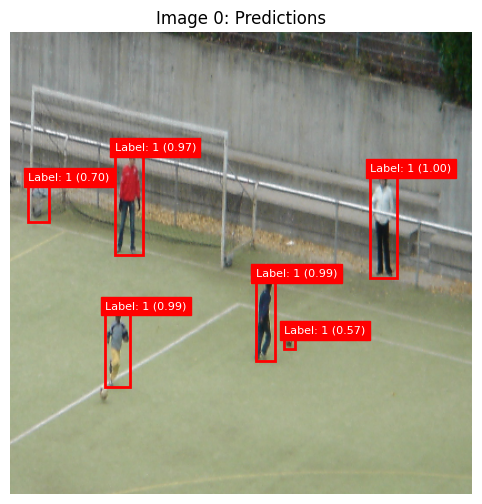

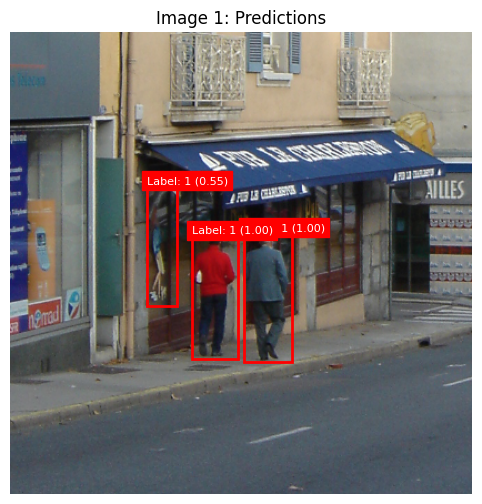

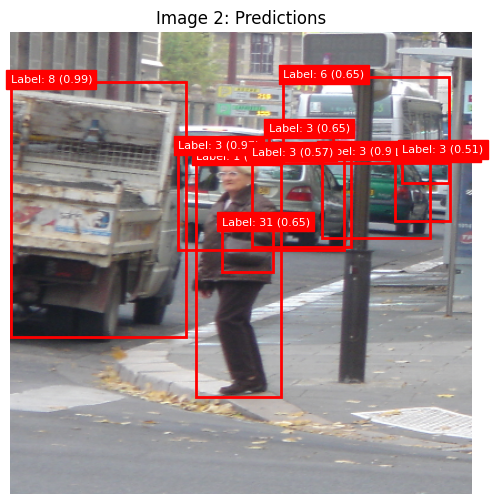

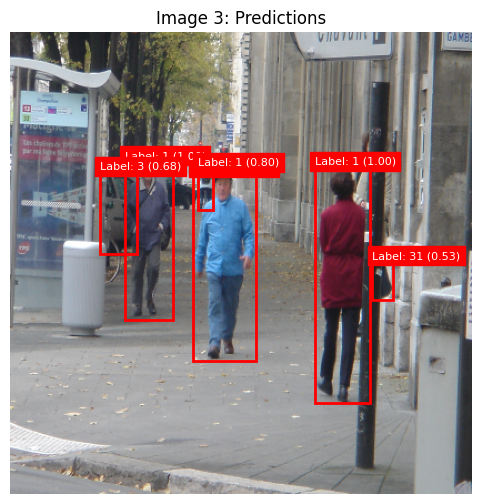

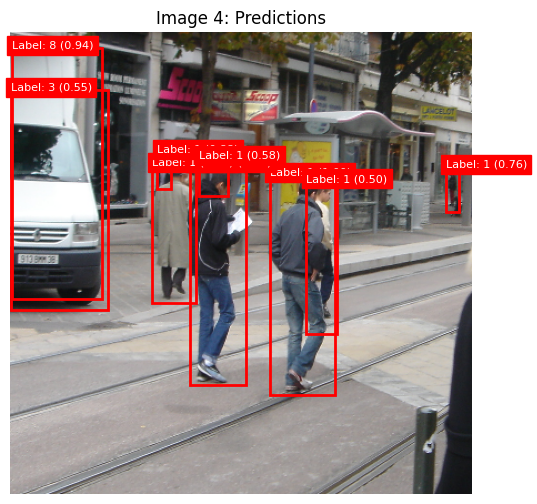

...

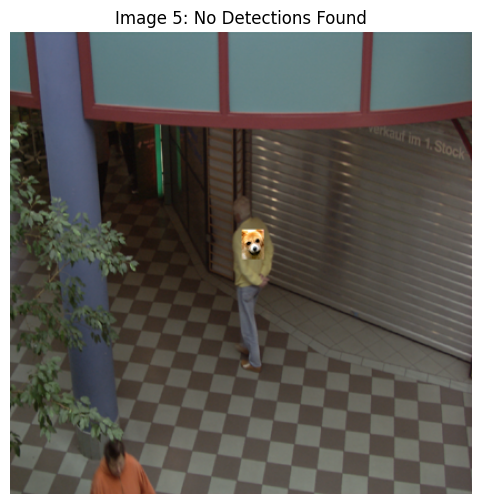

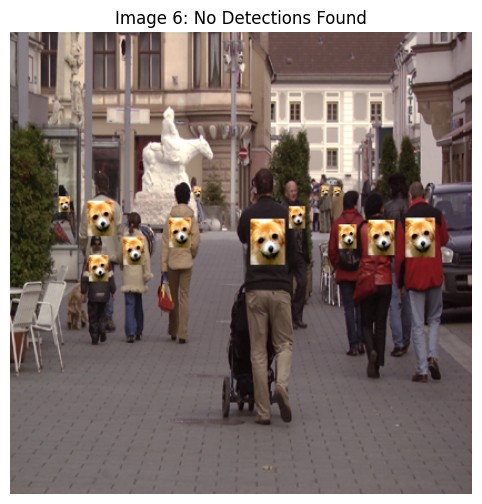

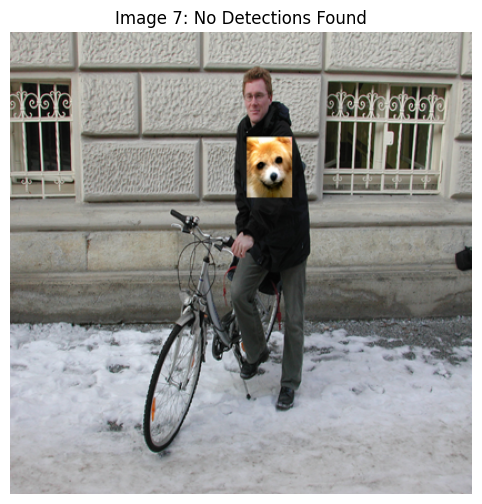

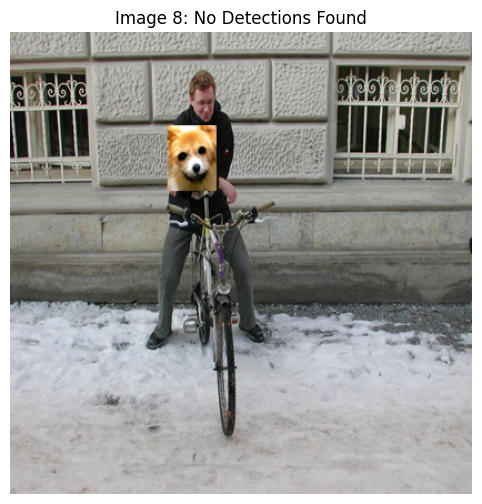

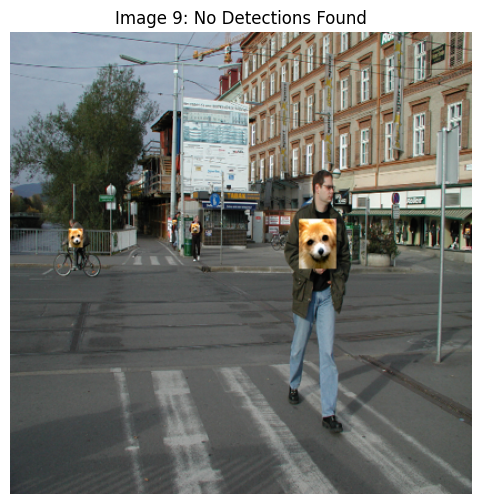

In [11]:
# --- Predictions BEFORE patch ---
# This should show boxes around people/objects (INRIA dataset)
visualize_predictions(detector, x_test[:10], threshold=0.5)

# --- Predictions AFTER patch ---
# If the DPatch is successful, boxes should disappear or the labels should change
visualize_predictions(detector, naturalistic_patch[:10], threshold=0.5)

In [38]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

def save_comparison(original, patched, out_dir="./results/Dpatch/75_75_FasterRCNN", num=5):
    os.makedirs(out_dir, exist_ok=True)
    for i in range(min(num, len(original))):
        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        axes[0].imshow(original[i])
        axes[0].set_title("Original")
        axes[1].imshow(patched[i])
        axes[1].set_title("DPatch Applied")
        for ax in axes:
            ax.axis("off")
        plt.tight_layout()
        plt.savefig(f"{out_dir}/comparison_{i}.png", dpi=150)
        plt.close()
    print(f"Saved {num} comparisons to {out_dir}/")

save_comparison(x_test, patched_images)

Saved 5 comparisons to ./results/Dpatch/75_75_FasterRCNN/


In [39]:
np.save("patched_images.npy", patched_images)

## Testing results on the defended images

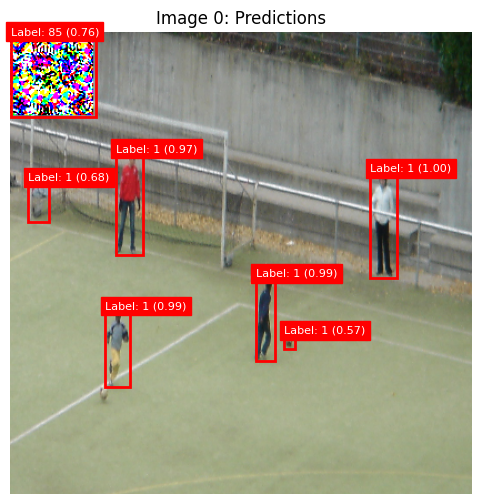

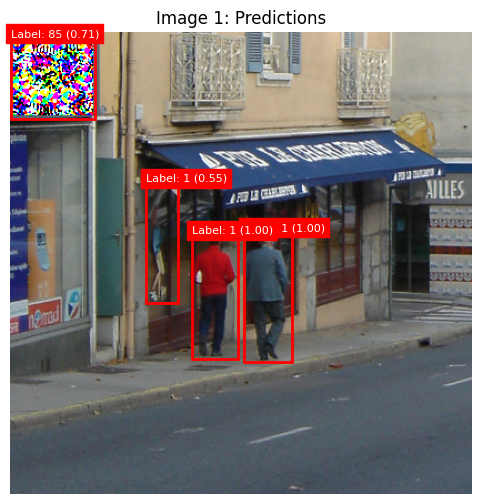

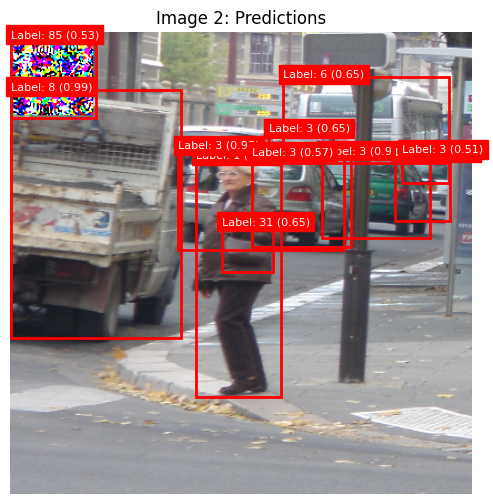

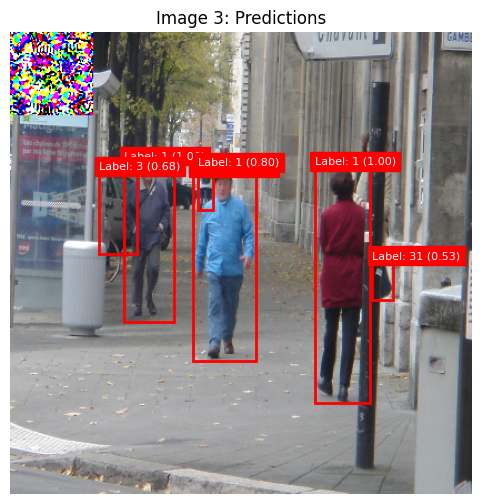

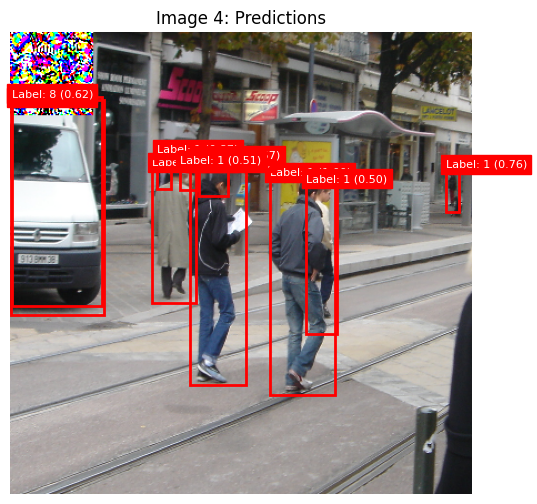

...

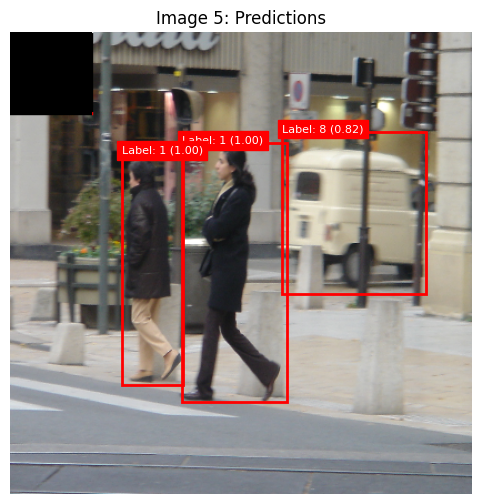

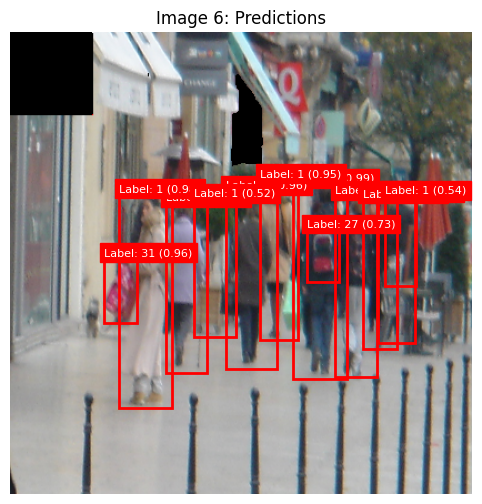

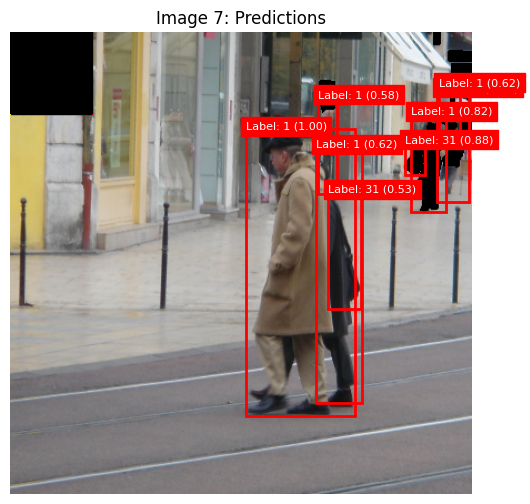

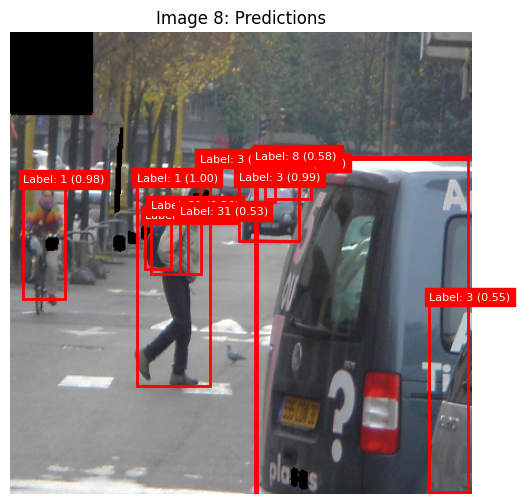

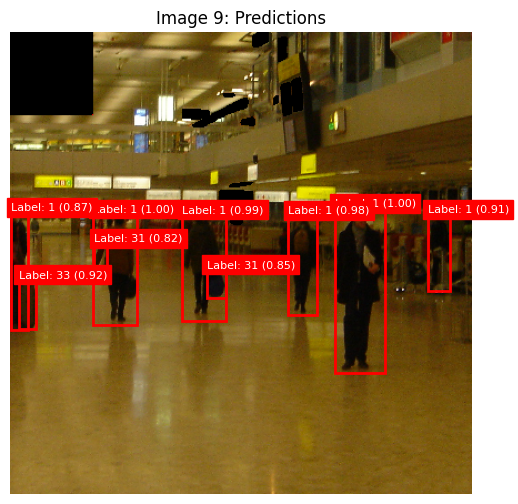

In [14]:
# --- Predictions BEFORE PAD ---
# This should show boxes around people/objects (INRIA dataset)
patched_images = np.load('patched_images.npy')
visualize_predictions(detector, patched_images[:10], threshold=0.5)

# --- Predictions AFTER PAD ---
# If the DPatch is successful, boxes should disappear or the labels should change
defended_images = np.load('dpatch_75_FasterRCNN_defended.npy')
defended_images = (defended_images / 255.0).astype(np.float32)
visualize_predictions(detector, defended_images[:10], threshold=0.5)

In [16]:
preds_patched = detector.predict(patched_images)
preds_defended = detector.predict(defended_images)


avg_conf_patched = np.mean([p['scores'].max() if len(p['scores']) > 0 else 0 for p in preds_patched])
avg_conf_defended = np.mean([p['scores'].max() if len(p['scores']) > 0 else 0 for p in preds_defended])


print(f"Patched Avg Confidence: {avg_conf_patched:.4f}")
print(f"Defended Avg Confidence: {avg_conf_defended:.4f}")
print(f"Total Confidence increase: {avg_conf_defended - avg_conf_patched:.4f}")

Patched Avg Confidence: 0.9976
Defended Avg Confidence: 0.9976
Total Confidence increase: -0.0001
